Trained data from 2010, 2014, and 2015

In [1]:
%matplotlib inline
import os
import sys
import copy
import itertools
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf

# stats scores
from sklearn.metrics import adjusted_mutual_info_score as ami
from sklearn.metrics import silhouette_score as sil

In [2]:
sys.path.insert(1, os.path.join(sys.path[0],"/home/tkurihana/scratch-midway2/data/MOD06/" ) )
from analysis_lib import _get_swath, _load_tif_data
from analysis_lib import _get_colors, _gen_patches, _anl_agl
from analysis_lib import cluster_plotting2, cluster_plotting

In [9]:
from analysis_lib import _cluster_plotting

In [100]:
from mpl_toolkits.mplot3d import Axes3D

#### tif swath1 coast of NZ

In [15]:
tifdir='/home/tkurihana/scratch-midway2/data/GEE/clouds_gee_2015_2016'
tifname='2015-06-28_MOD09GA_background_removal_zero_inputated_image_with_cf_10perc_grid_size10-0000017664-0000070656.tif'
swath1 = _get_swath(tifdir, tifname)

 Shape  (9054, 9496, 7)


In [4]:
datadir = '/home/tkurihana/scratch-midway2/anl'

In [5]:
SHAPE = 128, 128, 7

In [16]:
patches = _gen_patches(swath1, normalization=True)

In [7]:
colors = _get_colors(n=10)

### N_Cluster = 10, scale=5, 776,216 patches

In [10]:
n_cluster = 10

In [13]:
knn_label = np.load(datadir+'/knn_label_spark_5.0-nc10_2010-2014-2015.npy')

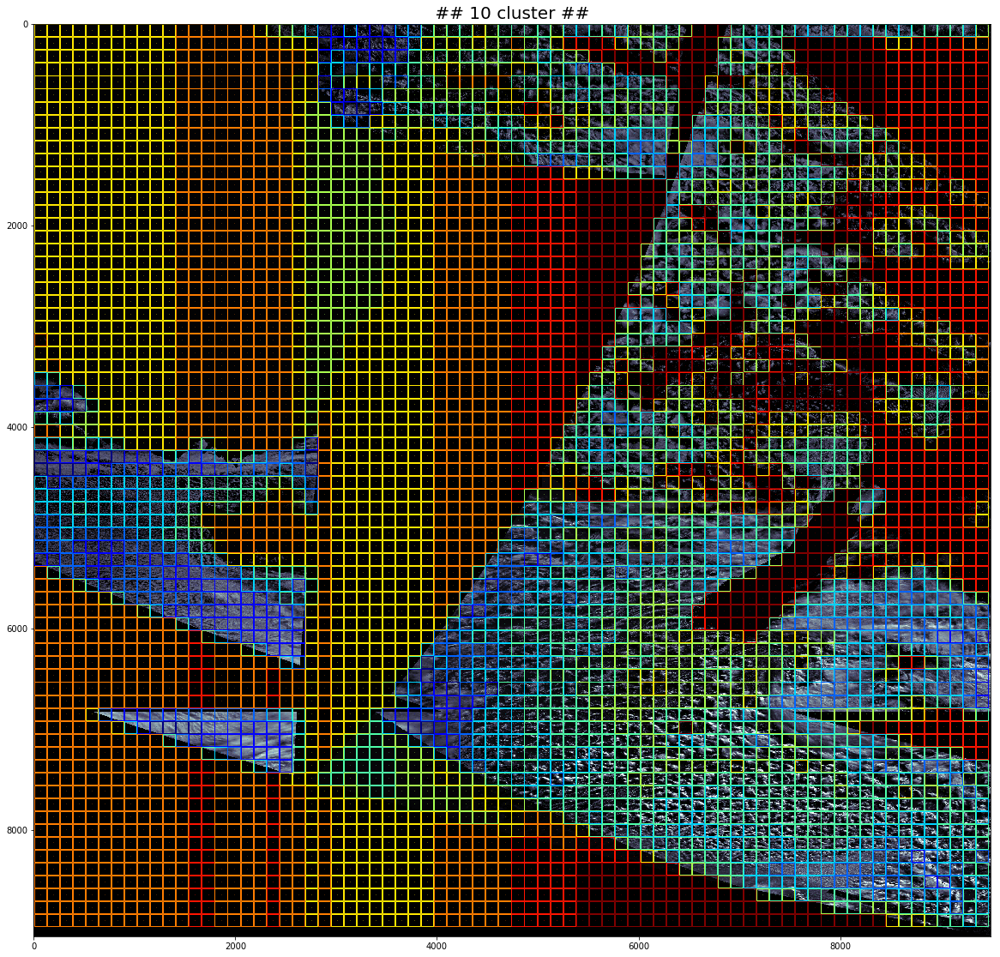

In [17]:
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [19]:
num_of_patches = np.load(datadir+'/sd_5.0_spark_patches_labels_2010-2014-2015.npy')

In [21]:
num_of_patches.shape

(776216,)

### N_Cluster = 10, scale=3, 1,166,012 patches

In [79]:
knn_label = np.load(datadir+"/knn_label_spark_3.0-nc10_2010-2014-2015.npy")

In [80]:
num_of_patches = np.load(datadir+'/sd_3.0_spark_patches_labels_2010-2014-2015.npy')
num_of_patches.shape

(1166012,)

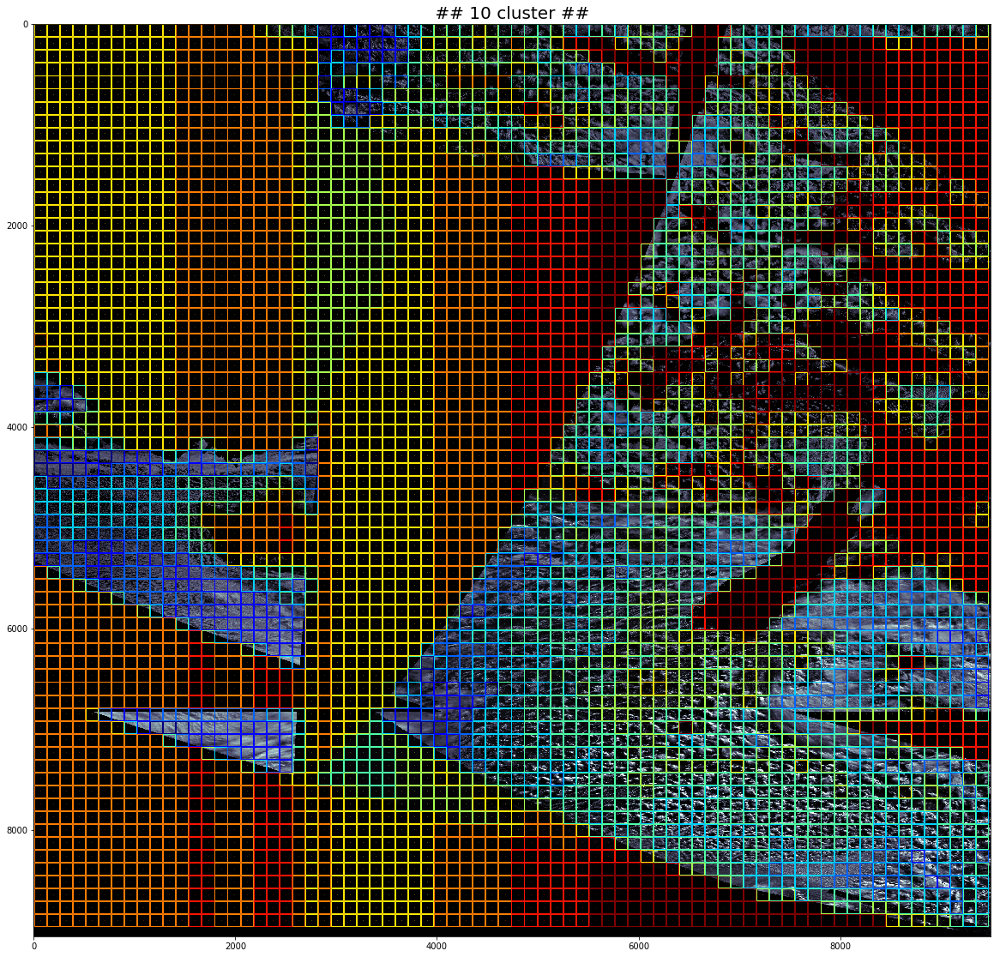

In [81]:
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

### Comp with 2015 only case 

#### N_Cluster = 10, scale = 5, 1,512,348 patches

In [36]:
_a = np.load(datadir+"/sd_knn_2015_07/sd_2_spark_patches_labels_2015July.npy")

In [37]:
_a.shape

(1512348,)

In [38]:
_knn_label = np.load(datadir+'/sd_knn_2015_07/knn_label_spark_2.npy')

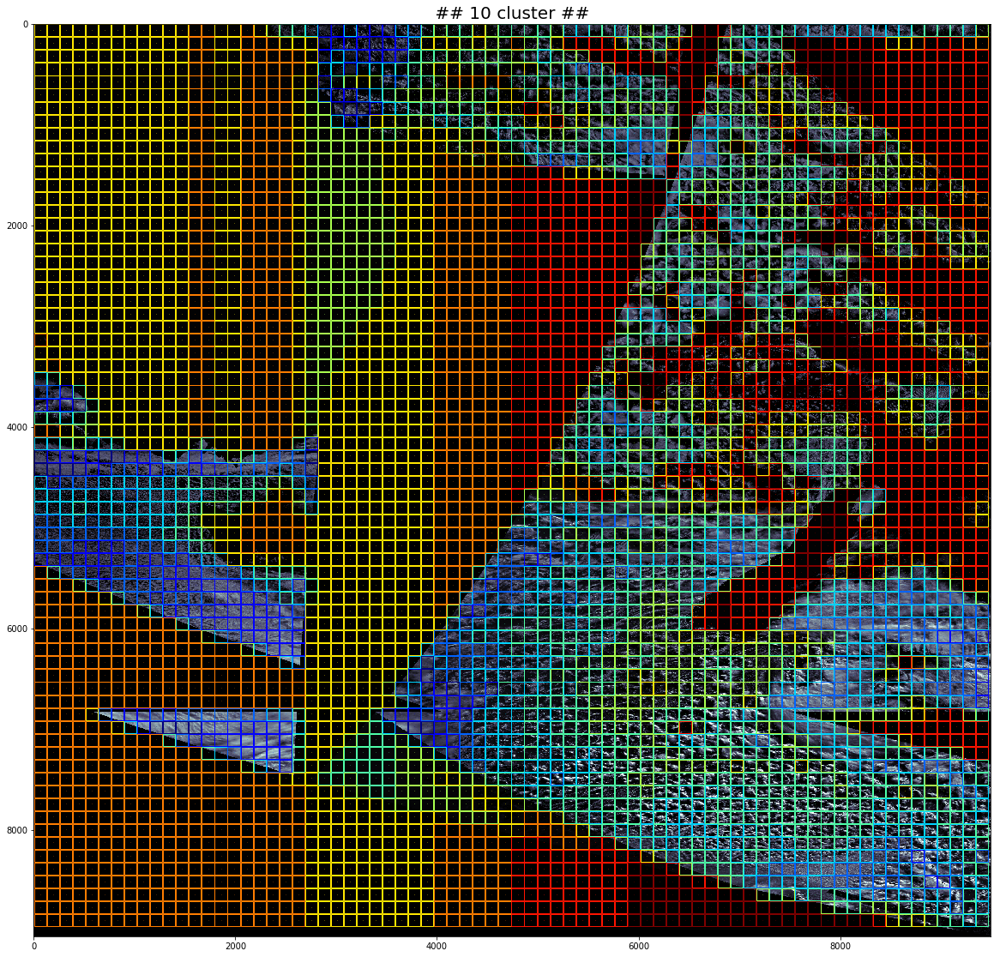

In [39]:
_cluster_plotting(swath1, patches, _knn_label, SHAPE, colors, ncluster=n_cluster)

### AMI score comparing 2010-2014-2015; scale=5 vs 2015 only case

In [40]:
ami(knn_label.flatten(), _knn_label.flatten())

0.8509660851215686

### AMI score comparing 2010-2014-2015; sscale=3 vs 2015 only case

In [82]:
ami(knn_label.flatten(), _knn_label.flatten())

0.8423909183729699

### AMI scores 2010-2014-2015s vs 2015 only cases

#### 2010-2014-2015

In [46]:
jranges = [2] + [x for x in range(10,80,5)]

In [83]:
iranges = [3] + [x for x in range(5,30,5)] + [x for x in range(40,80,5)]

In [84]:
"""
 iknn ==> 2010-2014-2015
 jknn ==> 2015 only
"""
ifilenum = []
jfilenum = []
ami_array= []
for irange in iranges :
    tmp_ami_array = []
    _iknn_label = np.load(datadir+'/knn_label_spark_'+str(irange)+'.0-nc10_2010-2014-2015.npy')
    ifile = np.load(datadir+"/sd_"+str(irange)+".0_spark_patches_labels_2010-2014-2015.npy")
    ifilenum += [ifile.shape[0]]
    iknn_label = _iknn_label.flatten()
    for jrange in jranges :
        if jrange <= 20:
            jknn_label = np.load(
                datadir+'/sd_knn_2015_07/knn_label_spark_'+str(jrange)+'.npy'
            )
            jfile = np.load(
                datadir+'/sd_knn_2015_07/sd_'+str(jrange)+'_spark_patches_labels_2015July.npy'
            )
        else:
            jknn_label = np.load(
                datadir+'/sd_knn_2015_07/knn_label_spark_'+str(jrange)+'.0.npy'
            )
            jfile = np.load(
                datadir+'/sd_knn_2015_07/sd_'+str(jrange)+'.0_spark_patches_labels_2015July.npy'
            )
        jfilenum += [jfile.shape[0]]
        tmp_ami_array += [ami(iknn_label, jknn_label.flatten() ) ]
    ami_array += [tmp_ami_array]

In [85]:
np.asarray(ami_array).shape

(14, 15)

In [86]:
len(ifilenum)

14

In [87]:
ni, nj = np.asarray(ami_array).shape

In [88]:
iarray = [ round(i*0.001) for i in ifilenum]

In [89]:
jarray = [ round(i*0.001) for i in jfilenum]

 Max AMI Score == 0.864388


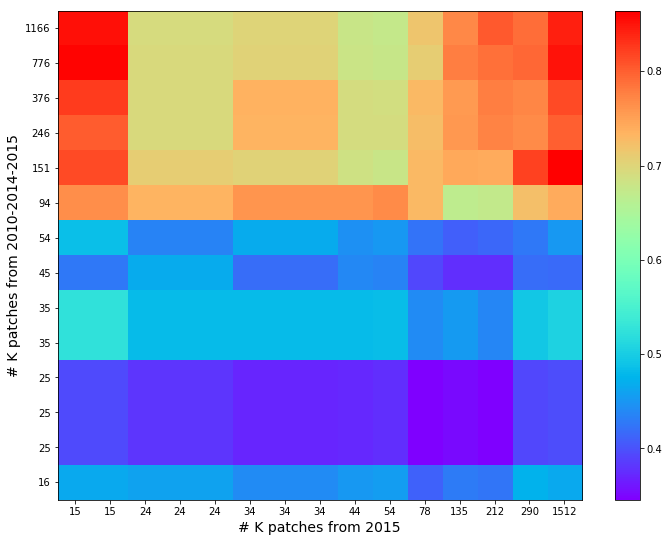

In [107]:
plt.figure(figsize=(12,9))
plt.imshow(np.asarray(ami_array)[:,::-1], cmap='rainbow')
plt.yticks(np.arange(ni), iarray)
plt.xticks(np.arange(nj), jarray[::-1])
plt.ylabel("# K patches from 2010-2014-2015", fontsize=14)
plt.xlabel("# K patches from 2015", fontsize=14)
plt.colorbar()
print(" Max AMI Score == %f" % np.amax(ami_array) )
plt.show()

#### CheckIO for low 2010- and high 2015 only cases

In [91]:
_i = 80
a =np.load(datadir+'/knn_label_spark_'+str(_i)+'.0-nc10_2010-2014-2015.npy')
na = np.load(datadir+"/sd_"+str(_i)+".0_spark_patches_labels_2010-2014-2015.npy")

In [93]:
_j = 2
b = np.load(datadir+'/sd_knn_2015_07/knn_label_spark_'+str(_j)+'.npy')
nb = np.load(datadir+'/sd_knn_2015_07/sd_'+str(_j)+'_spark_patches_labels_2015July.npy')

In [94]:
ami(a.flatten(), b.flatten())

0.46643934070019405

In [96]:
na.shape, nb.shape

((15540,), (1512348,))

##### 15k training case in 2010-2014-2015

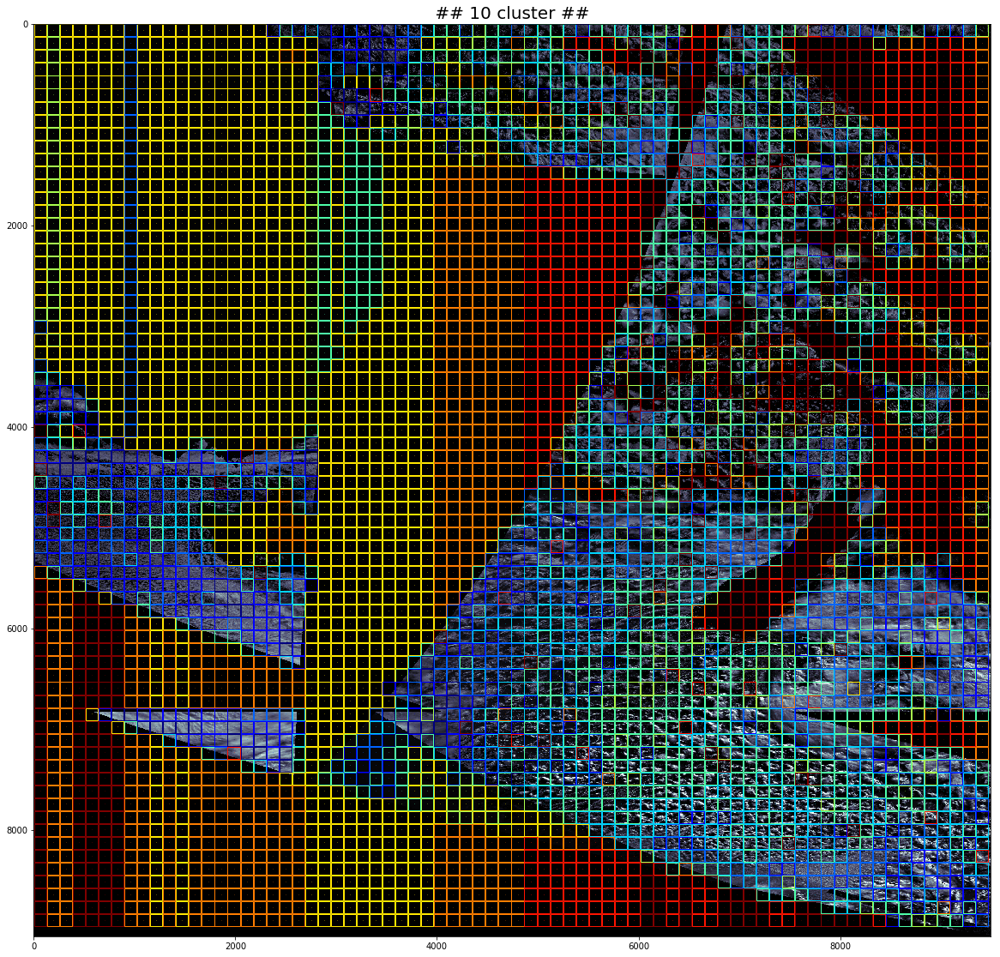

In [98]:
_cluster_plotting(swath1, patches, a, SHAPE, colors, ncluster=n_cluster)

#### 1.5M training cases from 2015 only

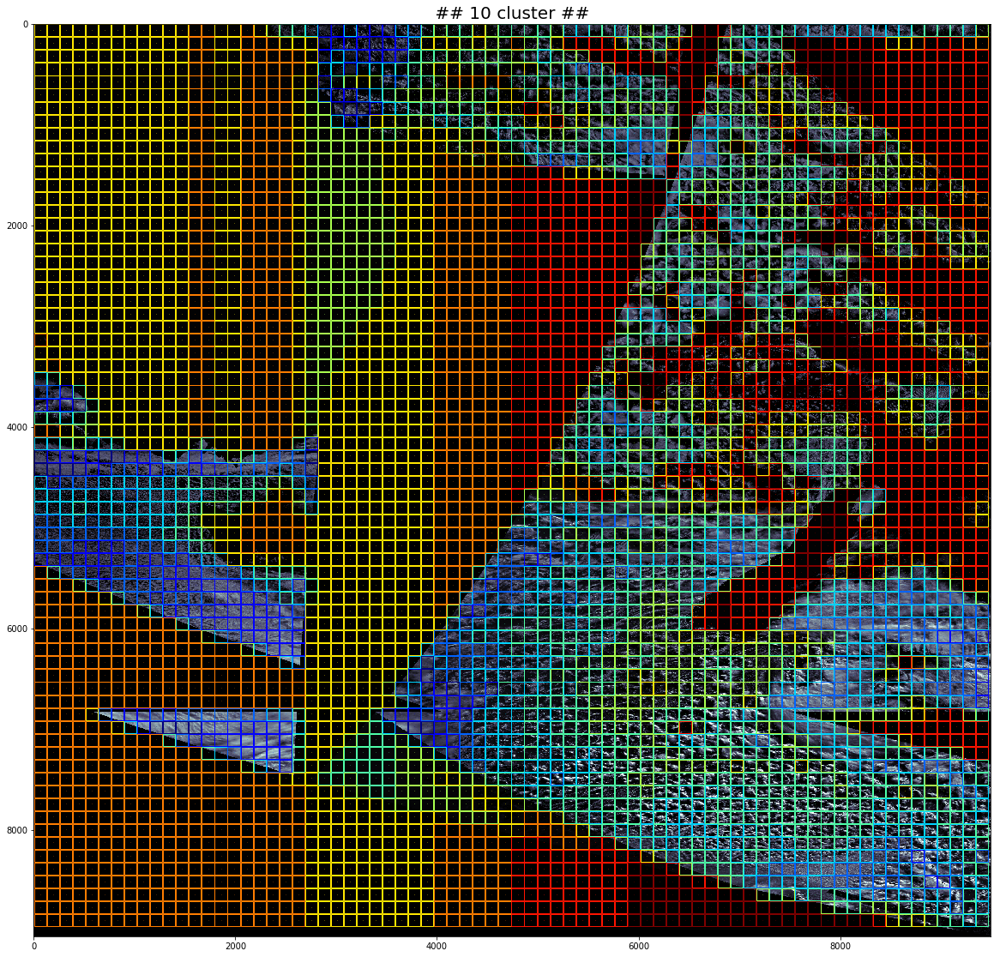

In [99]:
_cluster_plotting(swath1, patches, b, SHAPE, colors, ncluster=n_cluster)

#### CheckIO for high 2010- and low 2015 only cases

In [108]:
_i = 3
a =np.load(datadir+'/knn_label_spark_'+str(_i)+'.0-nc10_2010-2014-2015.npy')
na = np.load(datadir+"/sd_"+str(_i)+".0_spark_patches_labels_2010-2014-2015.npy")

In [110]:
_j = 80
b = np.load(datadir+'/sd_knn_2015_07/knn_label_spark_'+str(_j)+'.0.npy')
nb = np.load(datadir+'/sd_knn_2015_07/sd_'+str(_j)+'.0_spark_patches_labels_2015July.npy')

In [111]:
na.shape, nb.shape

((1166012,), (14840,))

##### 1.1M patches in 2010 case

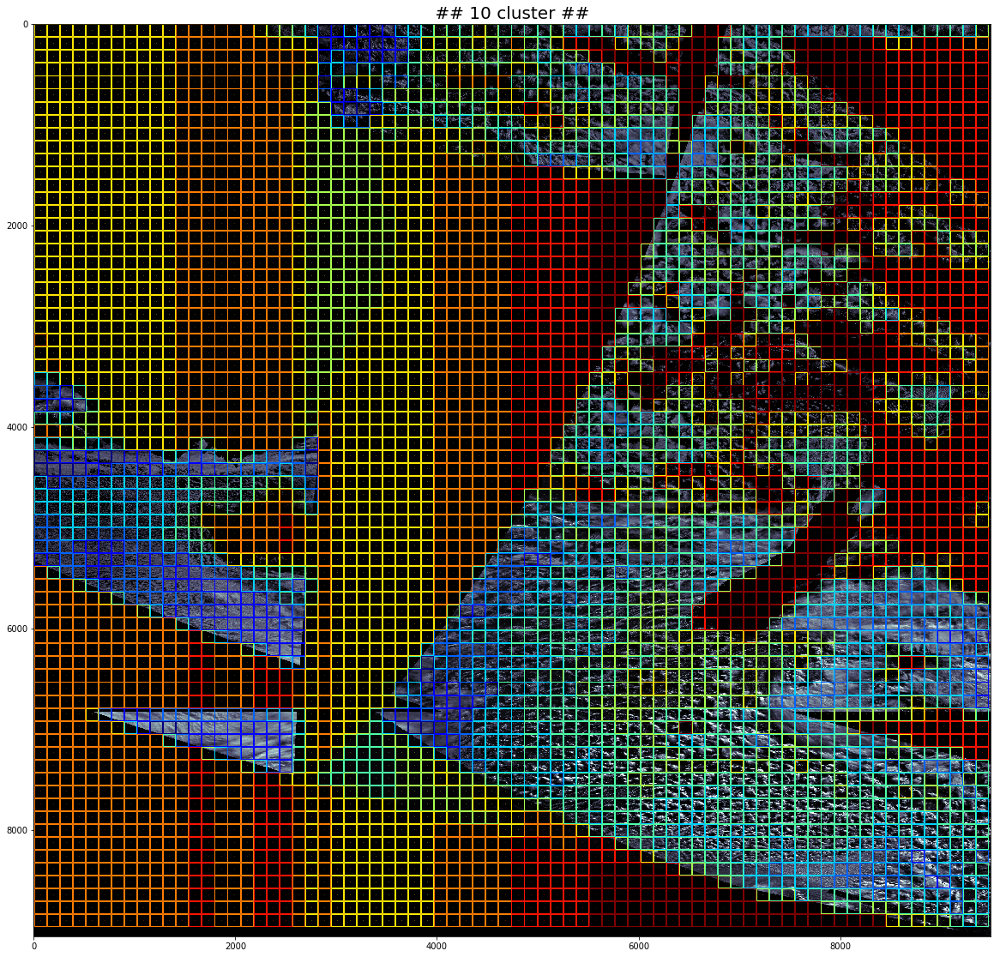

In [112]:
_cluster_plotting(swath1, patches, a, SHAPE, colors, ncluster=n_cluster)

#### 14K patches in 2015 only 

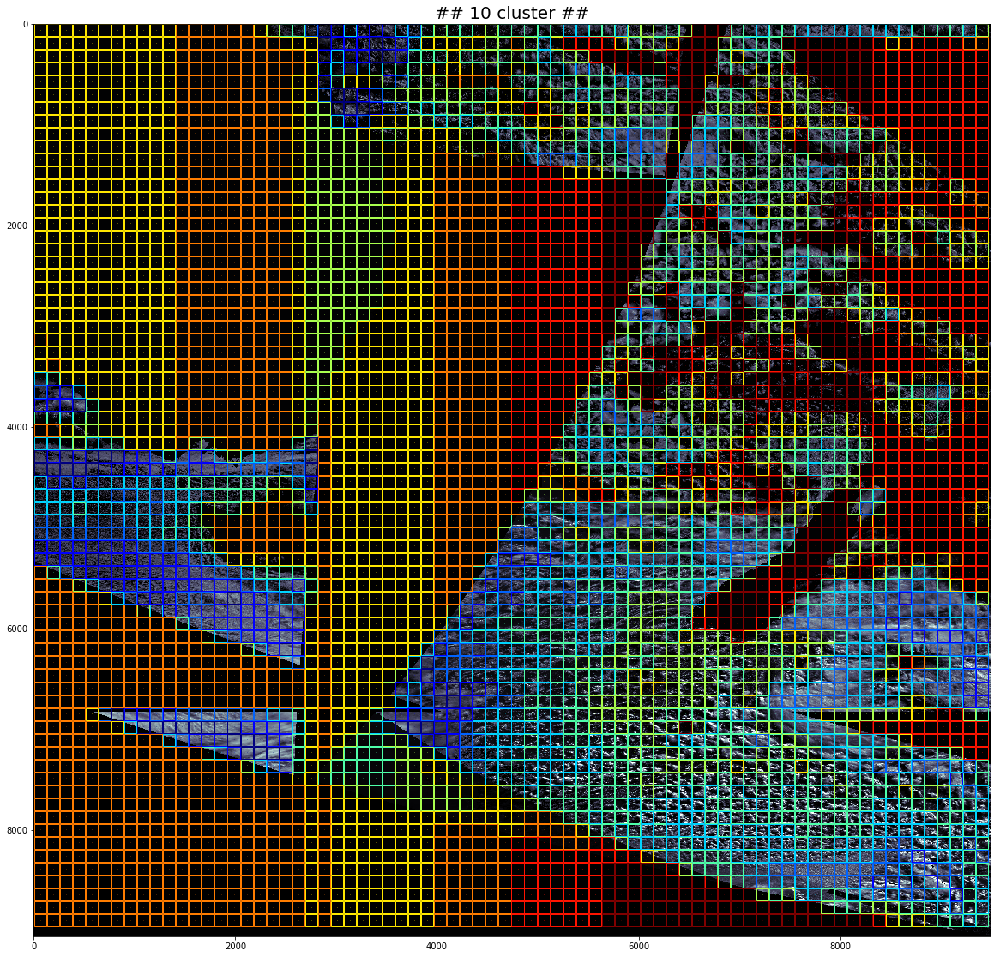

In [113]:
_cluster_plotting(swath1, patches, b, SHAPE, colors, ncluster=n_cluster)

In [114]:
ami(a.flatten(), b.flatten())

0.8539377869919846

### AMI score without background patches

##### make non-bk-array

In [115]:
nan_array = np.zeros((knn_label.shape))

In [116]:
nan_array.shape

(70, 74)

In [119]:
stride = 128
patch_size = 128
for idx, i in enumerate(range(0,swath1.shape[0], stride)):
    for jdx, j in enumerate(range(0,swath1.shape[1], stride)):
        if i + patch_size <= swath1.shape[0] and j + patch_size <= swath1.shape[1]:
            p = swath1[i:i + patch_size, j:j + patch_size].astype(float)
            if not np.all(p <= 1.0e-5):
                nan_array[idx, jdx] = knn_label[idx, jdx]
            else:
                nan_array[idx, jdx] = np.nan

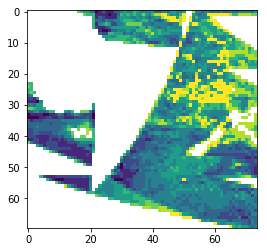

In [120]:
plt.imshow(nan_array)

##### Functionaize

In [122]:
def get_nan_array(swath1, knn_label):
    stride = 128
    patch_size = 128
    nan_list = []
    for idx, i in enumerate(range(0,swath1.shape[0], stride)):
        for jdx, j in enumerate(range(0,swath1.shape[1], stride)):
            if i + patch_size <= swath1.shape[0] and j + patch_size <= swath1.shape[1]:
                p = swath1[i:i + patch_size, j:j + patch_size].astype(float)
                if not np.all(p <= 1.0e-5):
                    #nan_array[idx, jdx] = knn_label[idx, jdx]
                    nan_list+=[knn_label[idx, jdx]]
                else:
                    #nan_array[idx, jdx] = np.nan
                    pass
    return  nan_list

#### compare AMI arrays

In [124]:
"""
 iknn ==> 2010-2014-2015
 jknn ==> 2015 only
"""
ifilenum = []
jfilenum = []
nbk_ami_array= []
for irange in iranges :
    tmp_ami_array = []
    _iknn_label = np.load(datadir+'/knn_label_spark_'+str(irange)+'.0-nc10_2010-2014-2015.npy')
    ifile = np.load(datadir+"/sd_"+str(irange)+".0_spark_patches_labels_2010-2014-2015.npy")
    ifilenum += [ifile.shape[0]]
    iknn_label = get_nan_array(swath1, _iknn_label)
    for jrange in jranges :
        if jrange <= 20:
            _jknn_label = np.load(
                datadir+'/sd_knn_2015_07/knn_label_spark_'+str(jrange)+'.npy'
            )
            jfile = np.load(
                datadir+'/sd_knn_2015_07/sd_'+str(jrange)+'_spark_patches_labels_2015July.npy'
            )
        else:
            _jknn_label = np.load(
                datadir+'/sd_knn_2015_07/knn_label_spark_'+str(jrange)+'.0.npy'
            )
            jfile = np.load(
                datadir+'/sd_knn_2015_07/sd_'+str(jrange)+'.0_spark_patches_labels_2015July.npy'
            )
        jfilenum += [jfile.shape[0]]
        jknn_label = get_nan_array(swath1, _jknn_label)
        tmp_ami_array += [ami(iknn_label, jknn_label ) ]
    nbk_ami_array += [tmp_ami_array]

 Max AMI Score == 0.872828


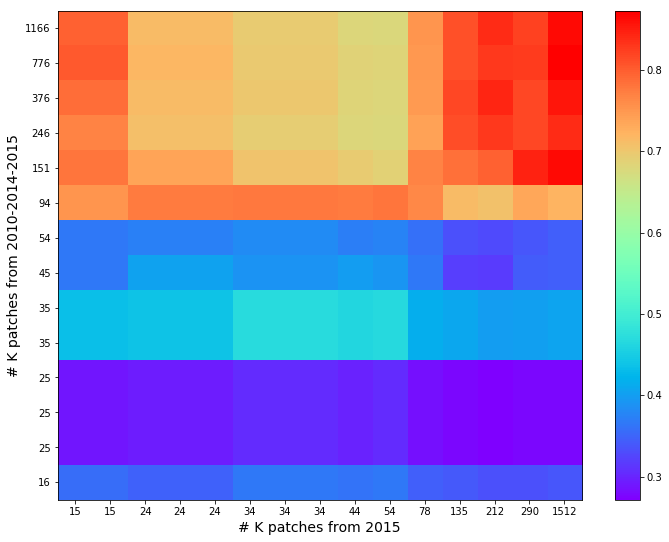

In [126]:
plt.figure(figsize=(12,9))
plt.imshow(np.asarray(nbk_ami_array)[:,::-1], cmap='rainbow')
plt.yticks(np.arange(ni), iarray)
plt.xticks(np.arange(nj), jarray[::-1])
plt.ylabel("# K patches from 2010-2014-2015", fontsize=14)
plt.xlabel("# K patches from 2015", fontsize=14)
plt.colorbar()
print(" Max AMI Score == %f" % np.amax(nbk_ami_array) )
plt.show()

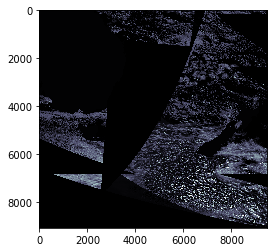

In [127]:
plt.imshow(swath1[:,:,0], cmap='bone')